### Setup

In case of lacking enough memory for some tasks we recommend running each example separately, for that restart the kernel and run the setup each time.

#### Setup enviroment

In [1]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import torch
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Specify the path to the main directory, this is the segment-anything-2 path
main_directory = "/home/asdasd/segment-anything-2"

# Change the current working directory to the main directory
os.chdir(main_directory)

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


#### Loading SAM2 Video Predictor

In [3]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint)

#### Load YOLO model from Ultralytics

In [4]:
from ultralytics import YOLO

yolo_checkpoint = "/home/asdasd/yolo-sam-2/yolo_weights/Salmons_YOLOv8.pt"
yolo_segmentator = YOLO(model=yolo_checkpoint, task="segment")

#### Utility functions to show with matplotlib

In [5]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))
    

def plot_contours(contours):
    plt.figure()
    
    for contour in contours:
        # Extract x and y coordinates from the contour
        x = contour[:, 0]
        y = contour[:, 1]

        # Plot the contour
        plt.plot(x, y, 'r', linewidth=2)

    # Set axis limits if needed (optional)
    plt.xlim(0, 1280)  # Adjust according to your image width
    plt.ylim(720, 0)   # Adjust according to your image height (reversed y-axis)

    # Show the plot with equal aspect ratio
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def plot_points_and_boxes(image_size, bounding_boxes, points):
    fig, ax = plt.subplots(1, figsize=(12, 8))

    # Ensure boxes is in the correct format (array of shape (n, 4))
    if isinstance(bounding_boxes, list):
        bounding_boxes = np.vstack(bounding_boxes)

    # Plot bounding boxes
    for box in bounding_boxes:
        x_min, y_min, x_max, y_max = box
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    # Plot the points as stars
    for point in points:
        ax.plot(point[0], point[1], marker='*', color='b', markersize=15)

    # Set limits to match the image size
    ax.set_xlim(0, image_size[1])
    ax.set_ylim(image_size[0], 0)  # Invert y-axis to match image coordinates

    plt.show()

#### Utility functions to get values from YOLO results

In [6]:
def get_bboxes(results):
    """ Returns a list of boxes from a YOLO result frame """
    list_of_bounding_boxes = []
    for result in results:
        bounding_boxes_in_frame = np.array([bb.cpu().numpy() for bb in result.boxes.xyxy], dtype=np.int16)
        list_of_bounding_boxes.append(bounding_boxes_in_frame)
    return list_of_bounding_boxes

def get_contours(results):
    """ Returns a list of contours from a YOLO result frame """
    list_of_contours = []
    for result in results:
        contours_in_frame = result.masks.xy
        list_of_contours.append(contours_in_frame)
    return list_of_contours

def find_centroid(contour):
    """ Return the centroid of a given contour as a list of two values [x, y] """
    centroid = np.mean(contour, axis=0)
    return centroid

def get_centroids(list_of_contours):
    """ Return a list of centroids tuples, given a list of contours """
    list_of_points = []
    for frame_contours in list_of_contours:
        centroids_in_frame = []
        for contour in frame_contours:
            centroids_in_frame.append(find_centroid(contour))
        list_of_points.append(centroids_in_frame)

    return list_of_points

def find_point_inside_contour(contour, number_of_points):
    # TODO make the implementation
    # Find a number of points as a pairs of (x,y) values.
    # These points need to be inside the mask that is formed by the contour (inside the area).
    # Points need to be in the next format np.array([[x1, y1], [x2, y2],...], dtype=np.float32)
    # for example for a single point: points = np.array([[820, 500]], dtype=np.float32)
    pass

def get_points_inside_contours(list_of_contours, number_of_points):
    list_of_points = []
    for frame_contours in list_of_contours:
        points_in_frame = []
        for contour in frame_contours:
            points_in_contour = find_point_inside_contour(contour, number_of_points)
            points_in_frame.append(points_in_contour)
        list_of_points.append(points_in_contour)

    return list_of_points

def generate_random_points_outside_boxes(num_points, image_size, bounding_boxes):
    height, width = image_size
    points = []

    def is_point_outside_boxes(point, boxes):
        x, y = point

        # Ensure boxes is in the correct format (array of shape (n, 4))
        if isinstance(boxes, list):
            boxes = np.vstack(boxes)

        for box in boxes:
            x_min, y_min, x_max, y_max = box
            if x_min <= x <= x_max and y_min <= y <= y_max:
                return False
        return True

    while len(points) < num_points:
        random_point = (random.randint(0, width - 1), random.randint(0, height - 1))
        if is_point_outside_boxes(random_point, bounding_boxes):
            points.append(random_point)

    return points

#### Select a video

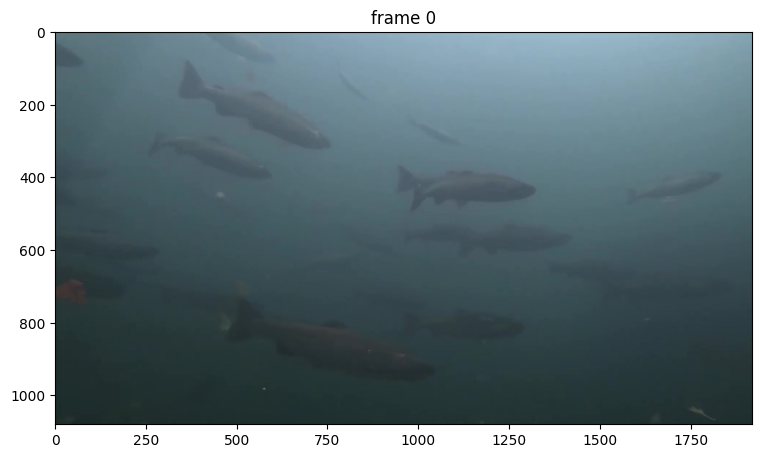

In [7]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "/home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))
frame_paths = [os.path.join(video_dir, frame_name) for frame_name in frame_names]

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state for SAM2 Video Predictor

In [8]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 100/100 [00:03<00:00, 32.25it/s]


### Example 1: Segment & track one object

#### Step 1: Add a first click on a frame

To get started, let's try to segment a fish.

Here we make a **positive click** at (x, y) = (550, 200) with label `1`, by sending their coordinates and labels into the `add_new_points` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

In [11]:
predictor.reset_state(inference_state)

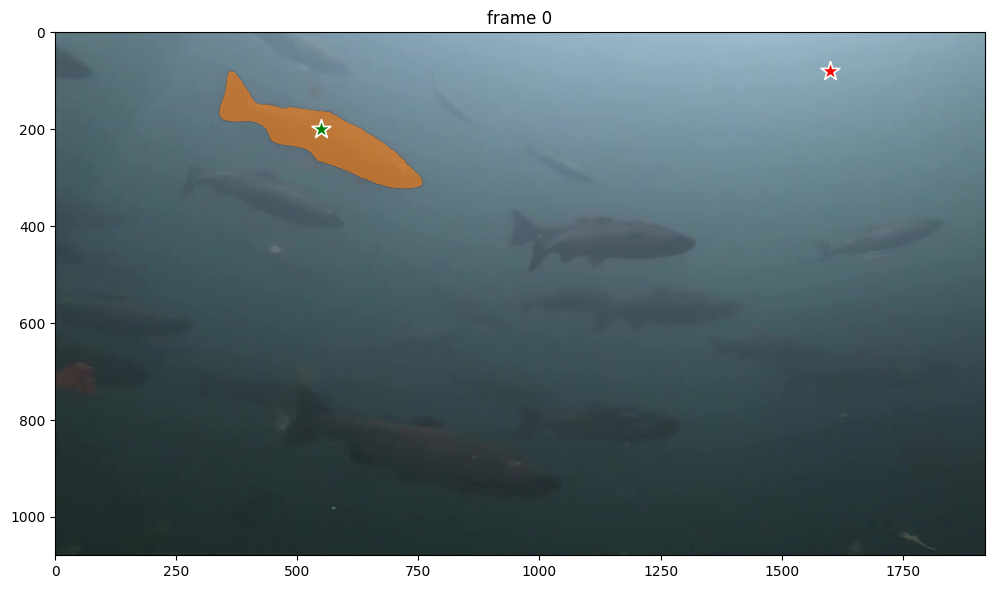

In [10]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)


# Let's add a positive click at (x, y) = (550, 200) to get started and a negative point at (x, y) = (1600, 80)
points = np.array([[550, 200], [1600, 80]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 0], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(12, 8))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

In [11]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:17<00:00,  5.83it/s]


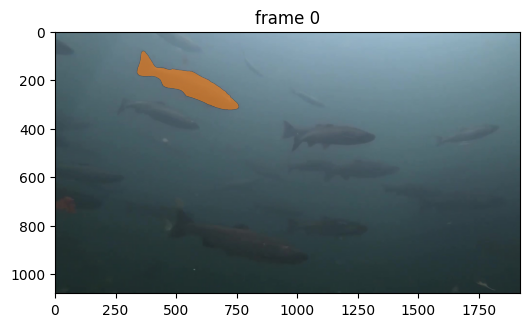

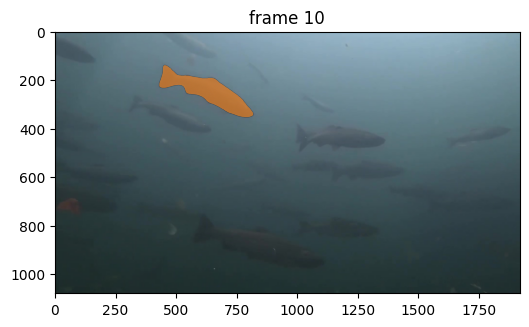

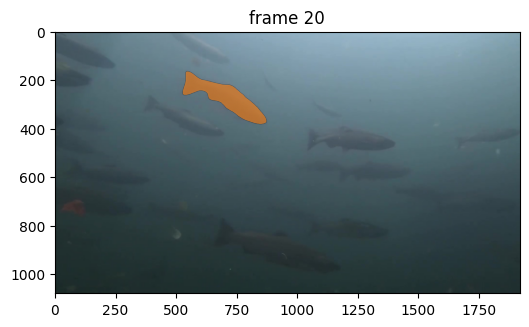

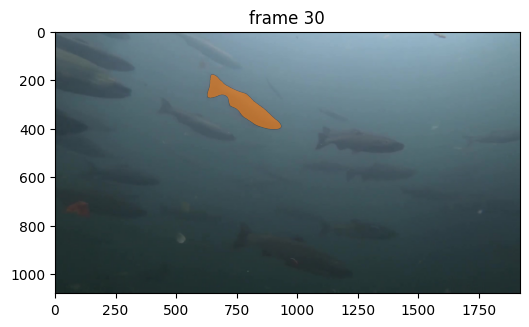

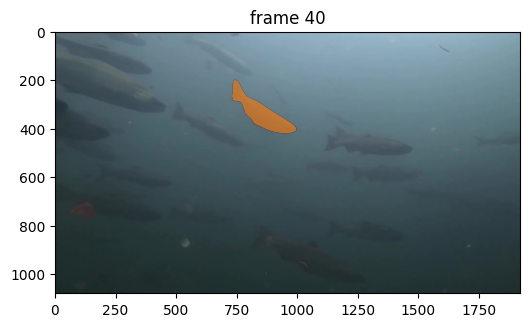

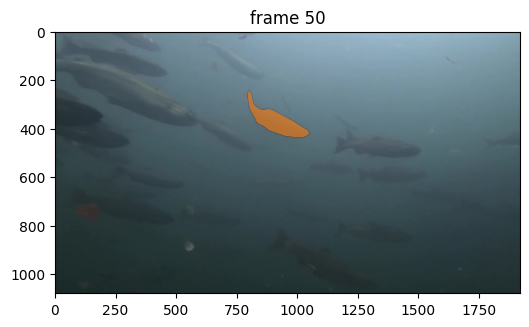

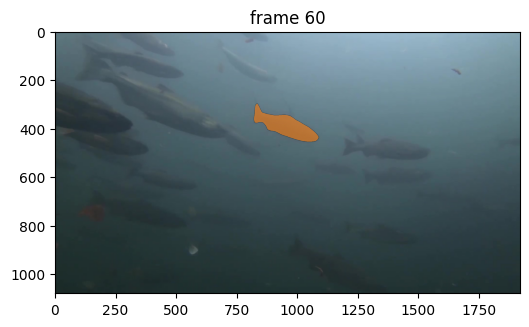

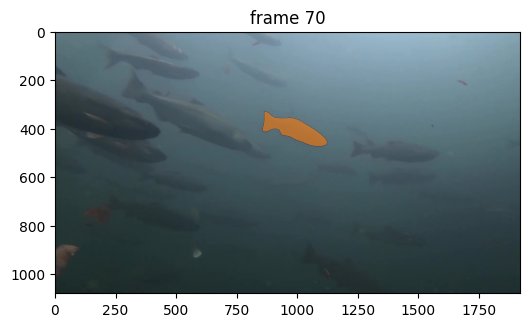

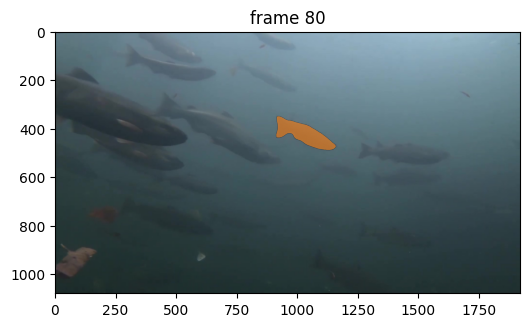

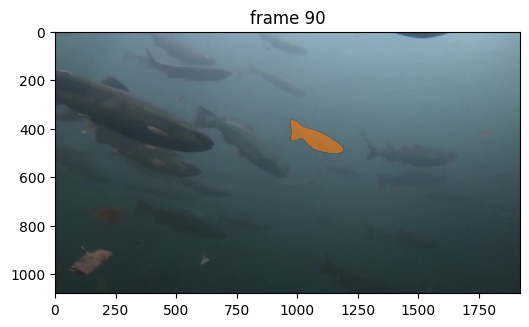

In [12]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 3: Do the same but with a box

In [14]:
predictor.reset_state(inference_state)

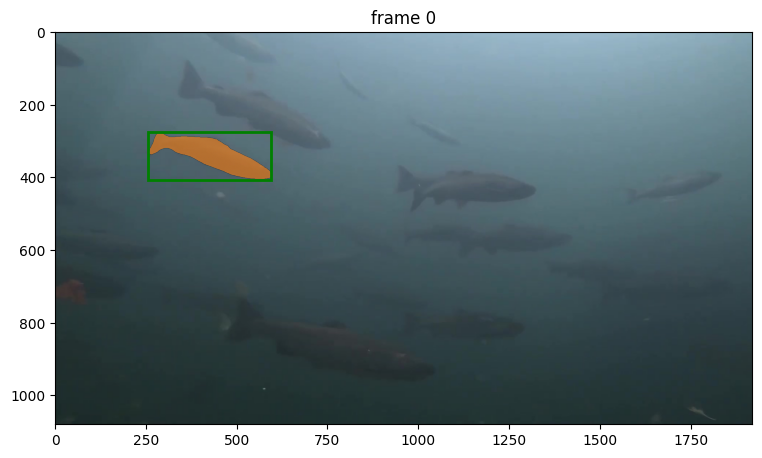

In [15]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = ([ 256,  276,  594,  408]) to get started
box = np.array([ 256,  276,  594,  408], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

We can refine the segmentation by sending both the box and a point over the object. To do this you need to send both at the same time.

In [17]:
predictor.reset_state(inference_state)

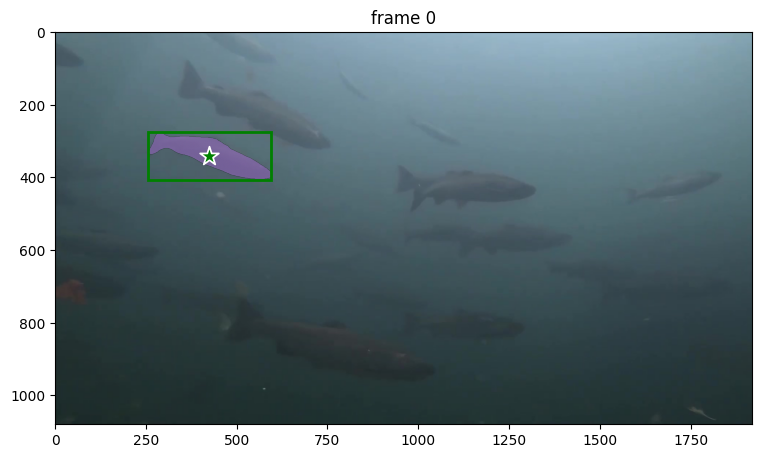

In [18]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (425, 342) to refine the mask
points = np.array([[425, 342]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([256, 276, 594, 408], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 5: Propagate throught the video

In [19]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:17<00:00,  5.83it/s]


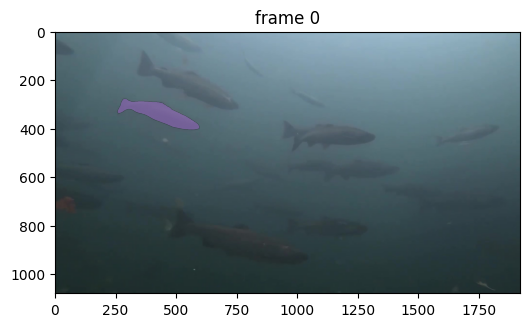

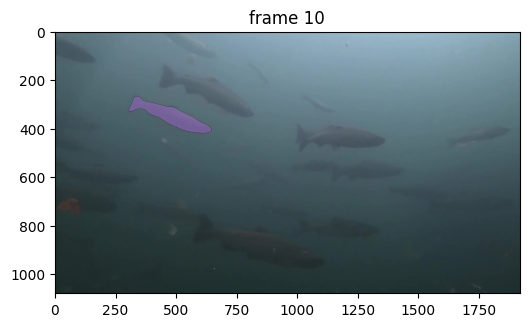

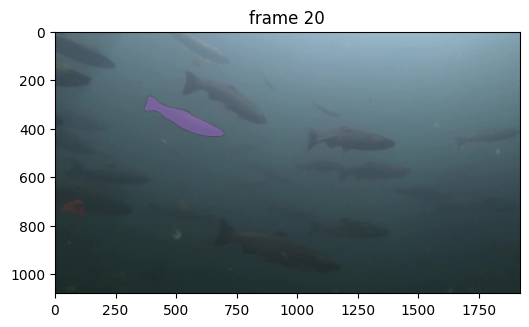

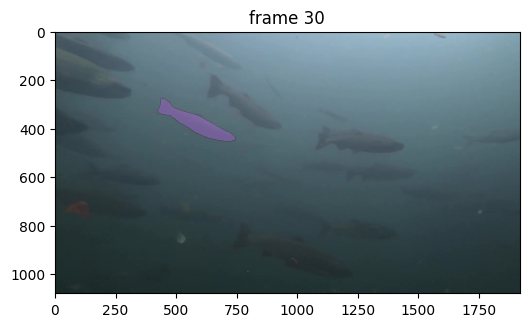

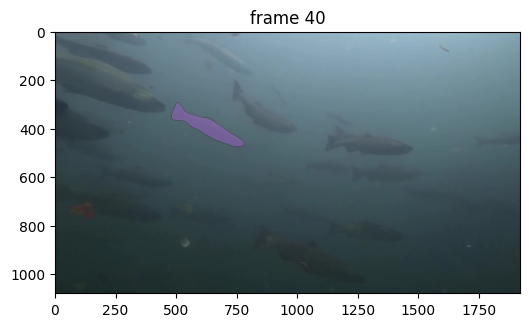

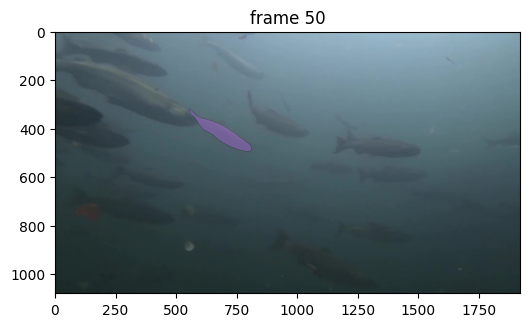

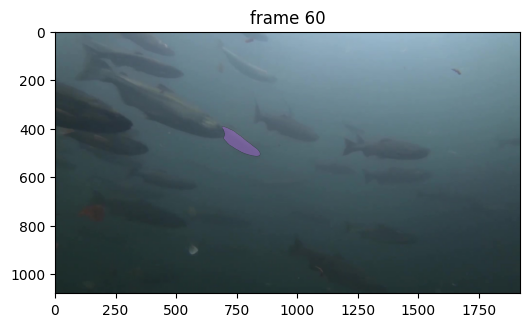

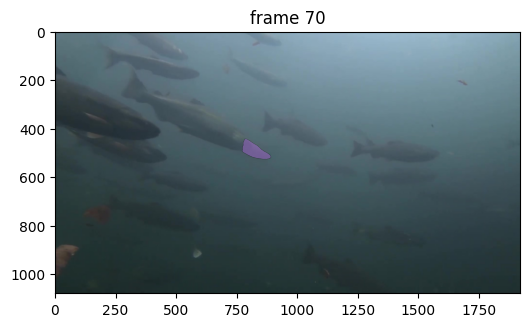

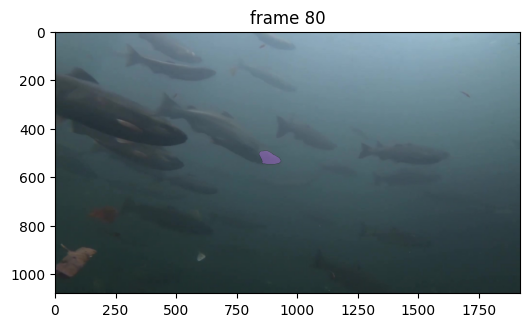

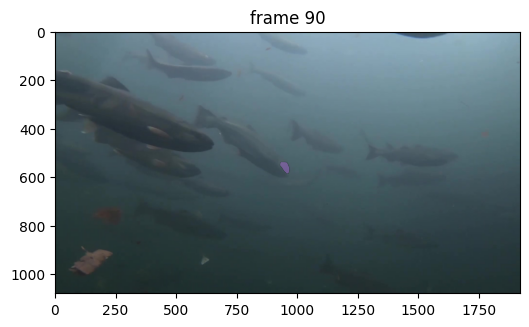

In [20]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

### Example 2: Use YOLO results as prompt for Semantic Segmentation

In this example we take multiple points as a prompt but assing a single label to all of them, effectively making a semantic segmentation and checking if SAM2 can track for this case.

#### Step 1: Obtain YOLO results

In [9]:
predictor.reset_state(inference_state)

In [10]:
ann_frame_idx = 0
image_path = frame_paths[ann_frame_idx]

results = yolo_segmentator.predict(image_path)


image 1/1 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00000.jpg: 384x640 13 salmons, 56.1ms
Speed: 1.5ms preprocess, 56.1ms inference, 91.0ms postprocess per image at shape (1, 3, 384, 640)


#### Step 2: Parse the results to get valid prompts for SAM2 add_new_points_or_box() method.

In [ ]:
contours = get_contours(results)
centroids = get_centroids(contours)
points = np.array(centroids[0], dtype=np.float32)
labels = np.ones(len(points) ,dtype=np.int32)

#### Step 3: Add the prompts to the specified frame

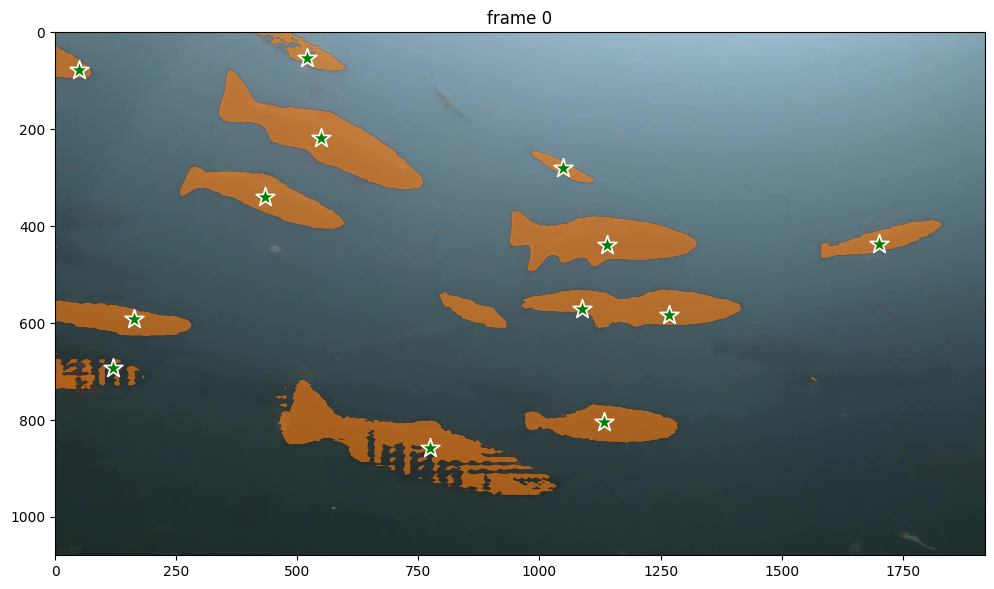

In [11]:
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(12, 8))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 4: Propagate through video

In [12]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:17<00:00,  5.74it/s]


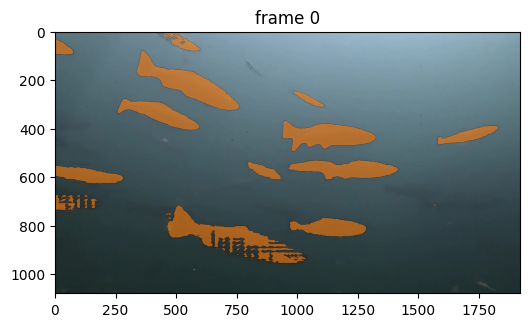

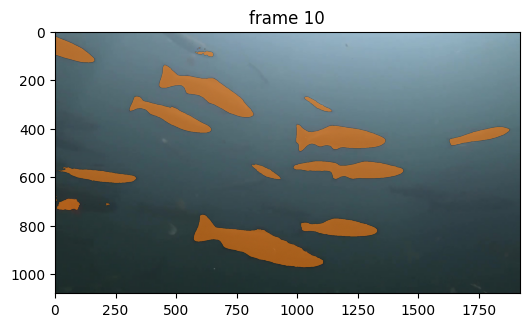

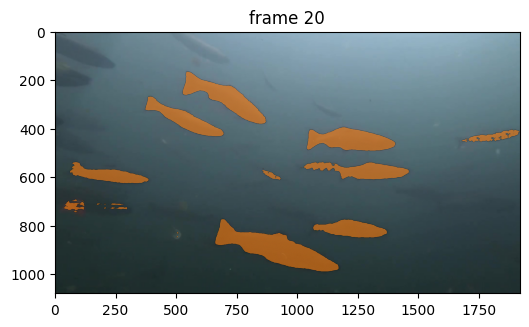

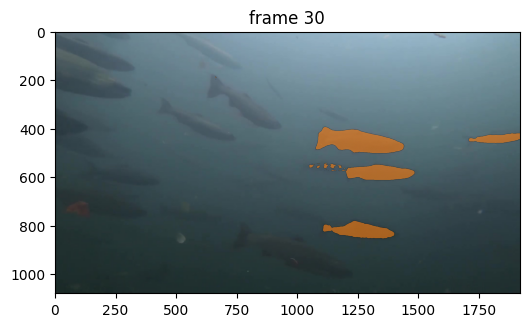

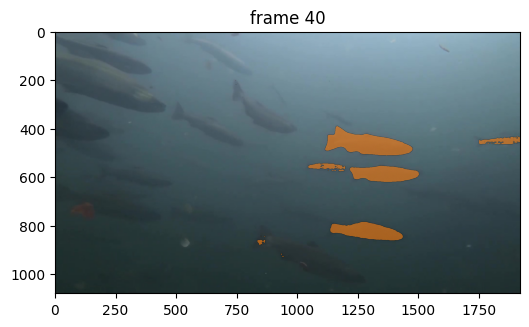

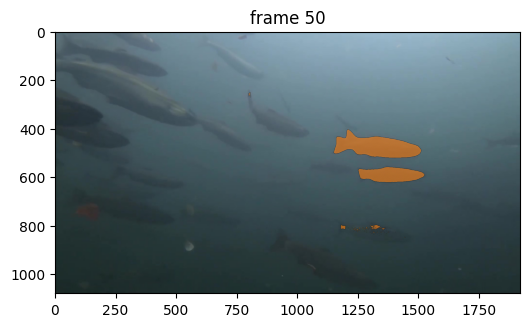

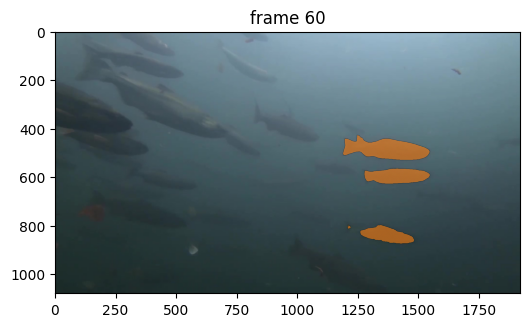

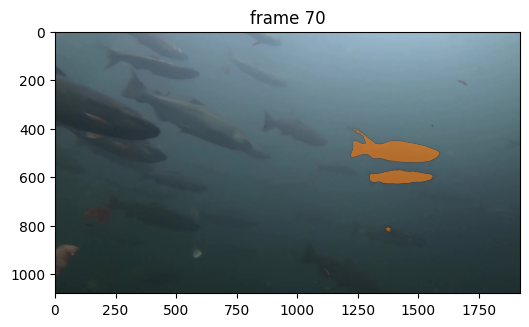

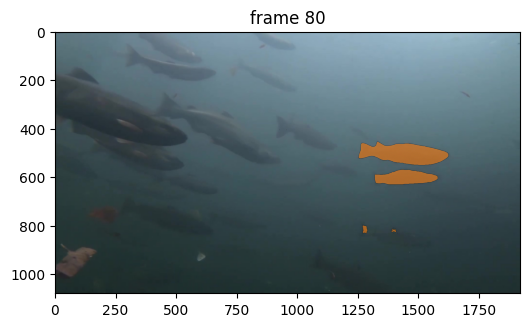

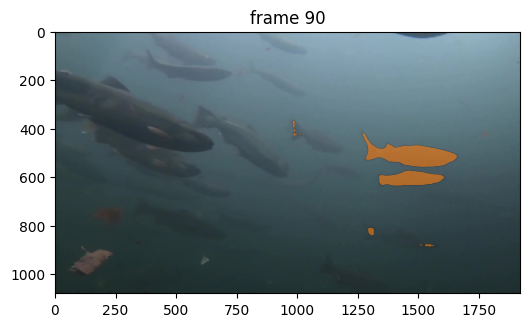

In [13]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

It doesn't seem to work fine. The model doesn't distinguish different entities unles given explicitly in the prompts, so in order to track multiple objects it's necessesary to provide points per object. But what if we add prompts to every single frame?

### Example 3: Semantic Segmentation prompts for every frame then propagate

For this example we expand the process shown in the last one and do it for every frame

In [26]:
predictor.reset_state(inference_state)

In [10]:
results = yolo_segmentator.track(video_dir)


image 1/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00000.jpg: 384x640 11 salmons, 78.5ms
image 2/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00001.jpg: 384x640 11 salmons, 24.0ms
image 3/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00002.jpg: 384x640 11 salmons, 29.9ms
image 4/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00003.jpg: 384x640 11 salmons, 24.0ms
image 5/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00004.jpg: 384x640 12 salmons, 24.2ms
image 6/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00005.jpg: 384x640 12 salmons, 18.3ms
image 7/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00006.jpg: 384x640 13 salmons, 20.3ms
image 8/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00007.jpg: 384x640 13 salmons

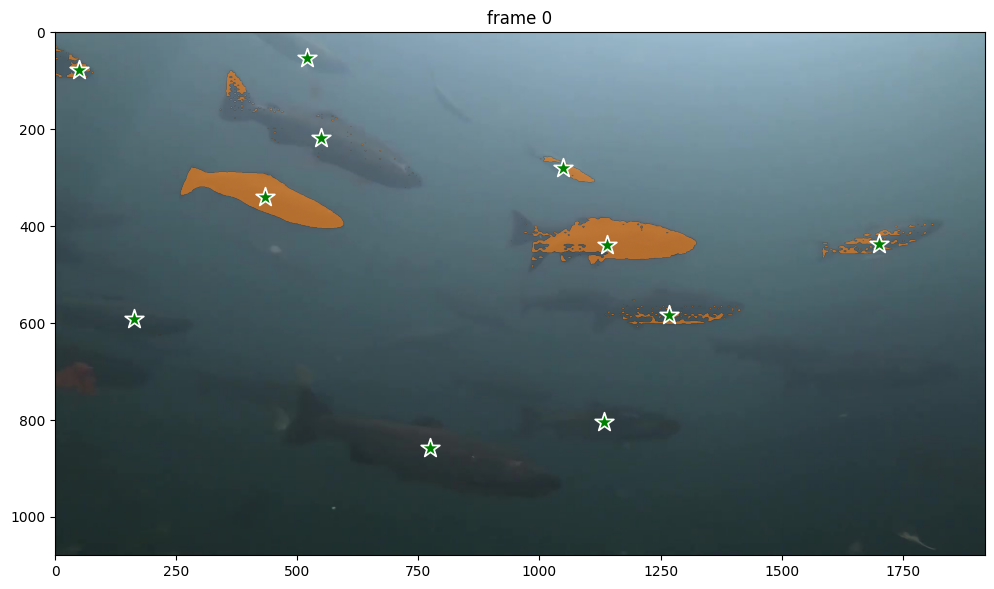

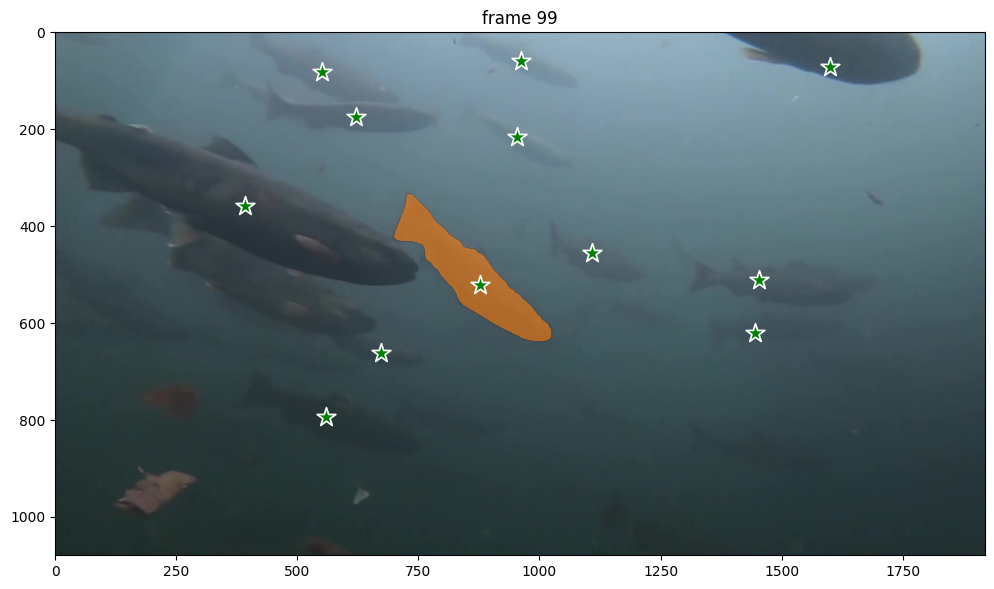

In [57]:
frame_data = {}

for frame_idx, frame_result in enumerate(results):
    contours = get_contours([frame_result])
    centroids = get_centroids(contours)
    points = np.array(centroids[0], dtype=np.float32)
    labels = np.ones(len(points) ,dtype=np.int32)

    ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=frame_idx,
        obj_id=ann_obj_id,
        points=points,
        labels=labels,
    )
    
    # Save first and last predicted results
    if frame_idx in [0, 99]:
        # show the results on the current (interacted) frame
        plt.figure(figsize=(12, 8))
        plt.title(f"frame {frame_idx}")
        plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))
        show_points(points, labels, plt.gca())
        show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

See the results for the first and last frame

#### Step 2: Propagate through video

In [58]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:00<00:00, 450.82it/s]


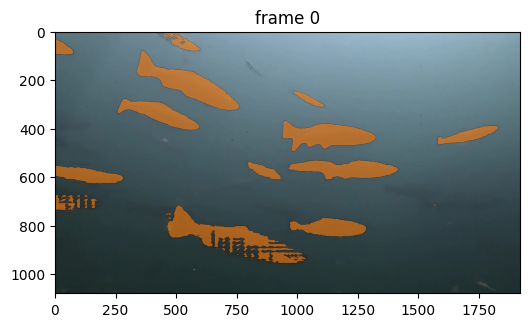

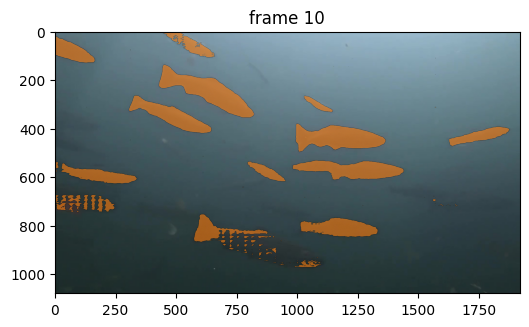

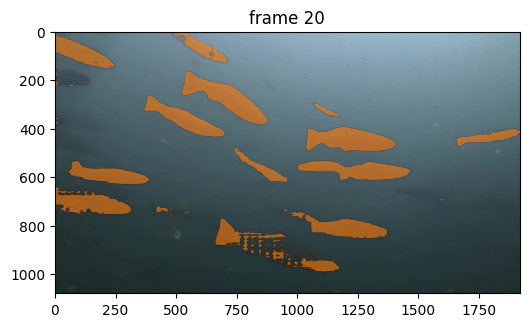

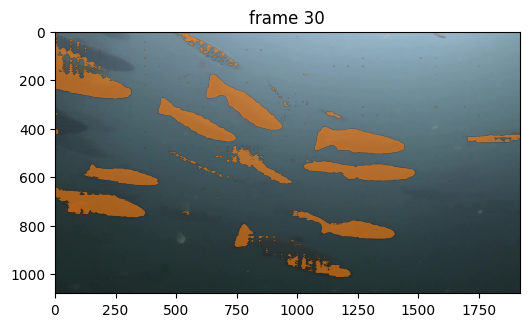

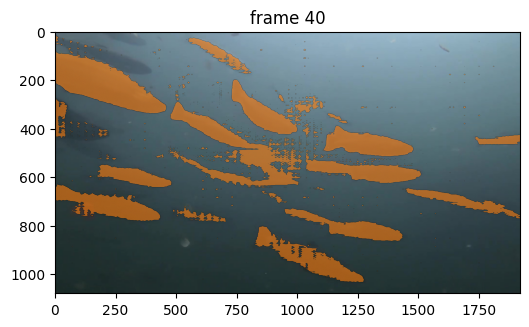

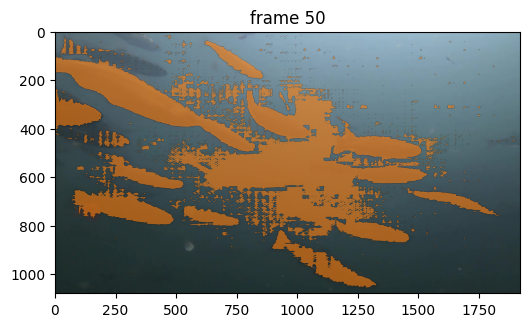

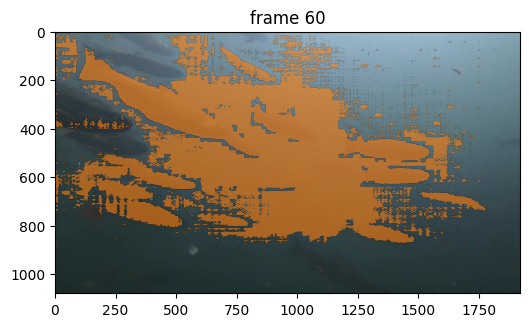

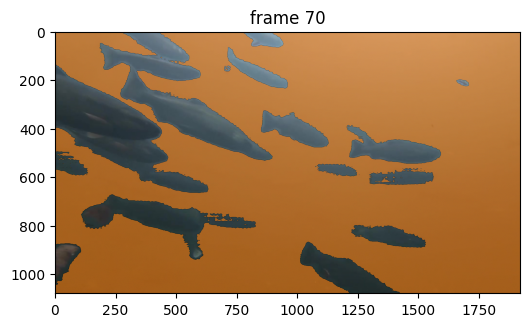

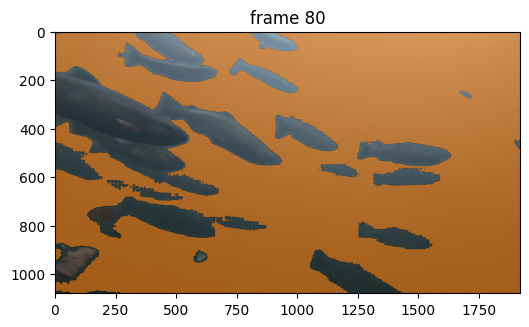

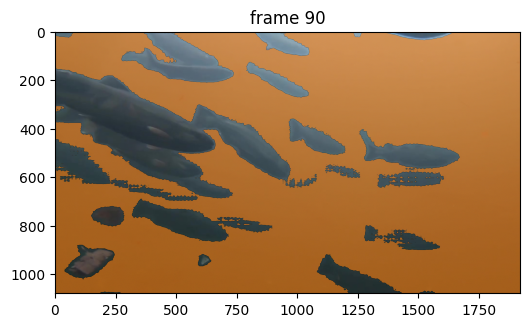

In [47]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

It seems that adding prompts to every single frame as a single object id makes it so the model confuses what to track as time passes. Maybe we need to add negative points in conjuction with positive points, that way we ensure

#### Step 3: Get negative points to add.

To do this we generate points outside the bounding boxes of detections. The function designed to get points outside boxes work for list of boxes as list of arrays or as a single big array.

In [9]:
results = yolo_segmentator.track(video_dir)


image 1/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00000.jpg: 384x640 11 salmons, 64.3ms
image 2/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00001.jpg: 384x640 11 salmons, 22.4ms
image 3/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00002.jpg: 384x640 11 salmons, 22.3ms
image 4/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00003.jpg: 384x640 11 salmons, 22.4ms
image 5/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00004.jpg: 384x640 12 salmons, 22.5ms
image 6/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00005.jpg: 384x640 12 salmons, 24.2ms
image 7/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00006.jpg: 384x640 13 salmons, 20.4ms
image 8/100 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00007.jpg: 384x640 13 salmons

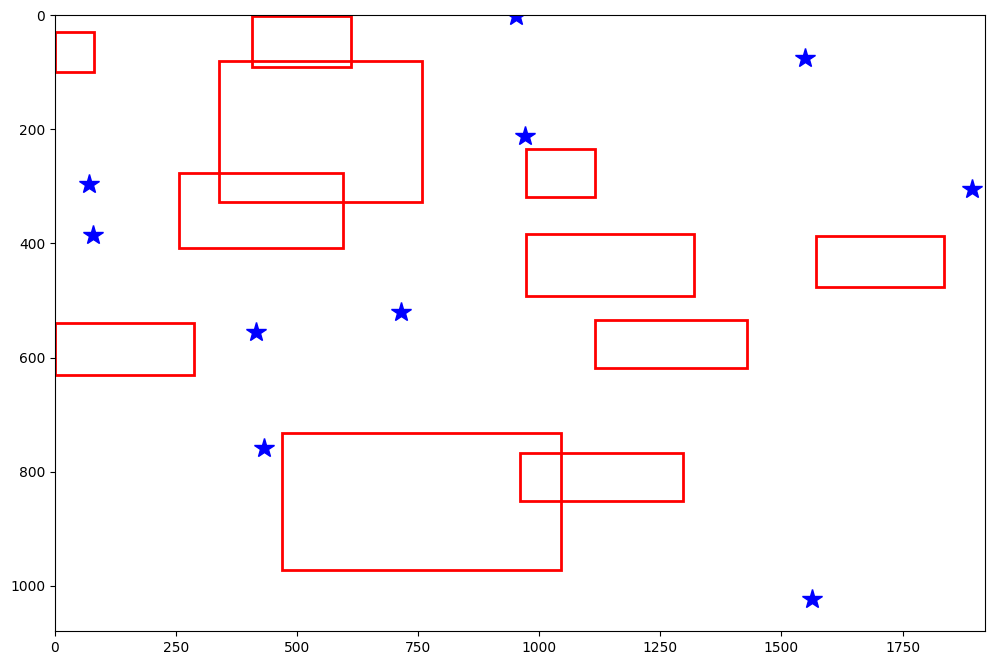

In [12]:
# Both works!
bounding_boxes = get_bboxes(results[0])
bounding_boxes = get_bboxes(results)[0]

image_size = (1080, 1920)
num_points = 10

random_points = generate_random_points_outside_boxes(num_points, image_size, bounding_boxes)
plot_points_and_boxes(image_size, bounding_boxes, random_points)

#### Step 4: Add negative and positive points for each frame.

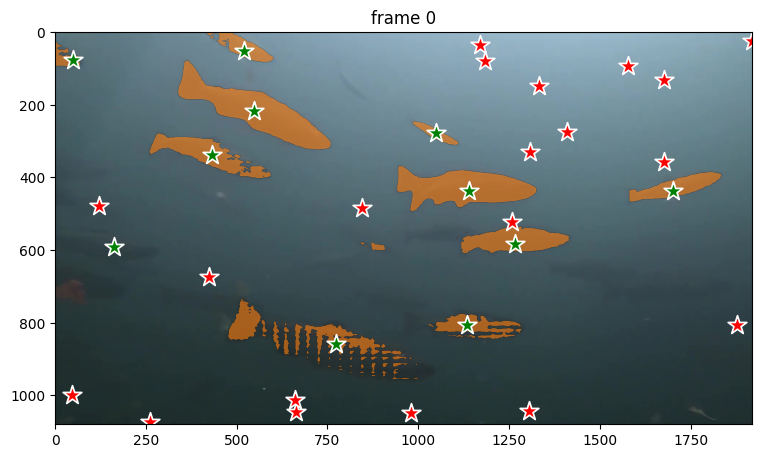

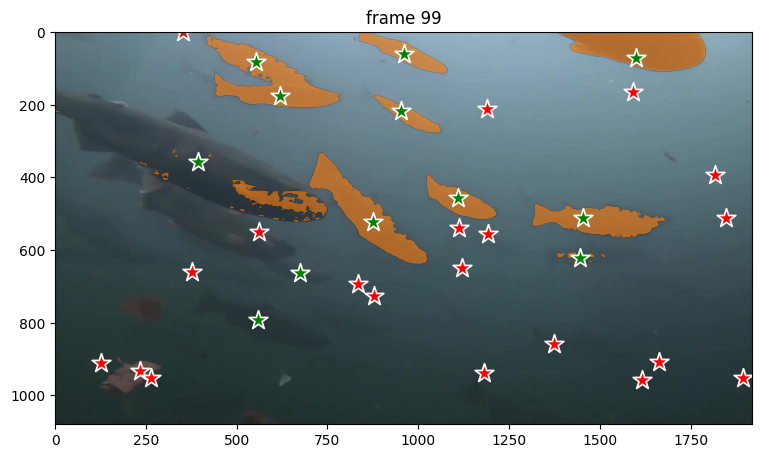

In [15]:
image_size = results[0].orig_shape
num_neg_points = 20

# Reset the predictor state
predictor.reset_state(inference_state)

for frame_idx, frame_result in enumerate(results):
    # Get negative points from outside the boxes
    boxes = get_bboxes(frame_result)
    neg_points = generate_random_points_outside_boxes(num_neg_points, image_size, boxes)

    # Get positive points inside the masks
    contours = get_contours([frame_result])
    centroids = get_centroids(contours)
    pos_points = np.array(centroids[0], dtype=np.float32)

    # Define labels for positive and negative points
    positive_labels = np.ones(len(pos_points), dtype=np.int32)
    negative_labels = np.zeros(num_neg_points, dtype=np.int32)
    
    # Concatenate and define points and labels
    points = np.concatenate((pos_points, neg_points), axis=0)
    labels = np.concatenate((positive_labels, negative_labels))

    ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=frame_idx,
        obj_id=ann_obj_id,
        points=points,
        labels=labels,
    )
    
    if frame_idx in [0, 99]:
        # show the results on the current (interacted) frame
        plt.figure(figsize=(9, 6))
        plt.title(f"frame {frame_idx}")
        plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))
        show_points(points, labels, plt.gca())
        for i, out_obj_id in enumerate(out_obj_ids):
            show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

#### Step 5: Propagate through video

In [16]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:00<00:00, 422.98it/s]


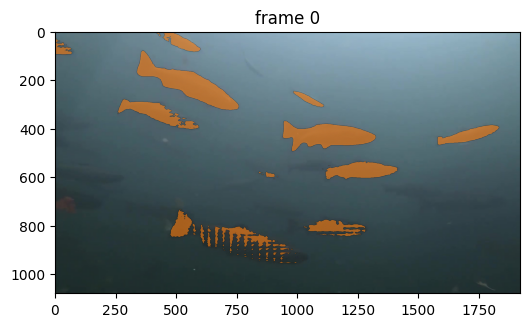

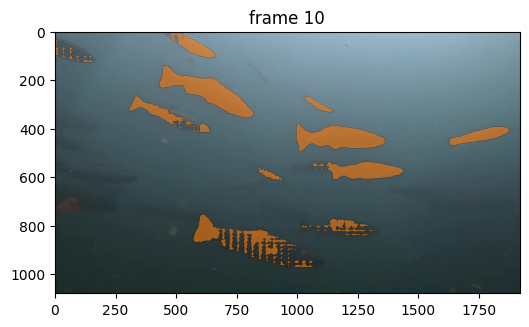

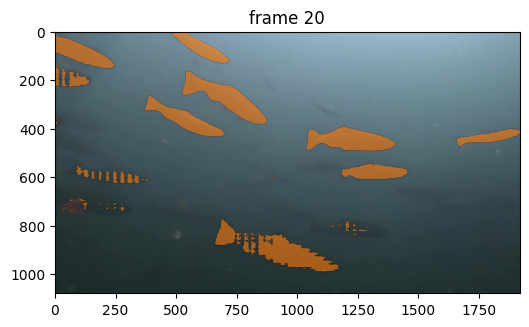

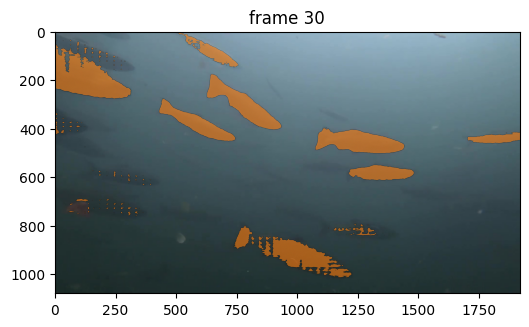

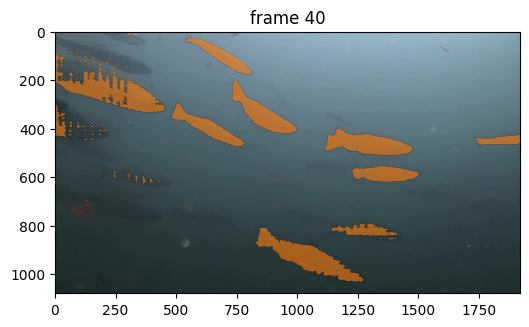

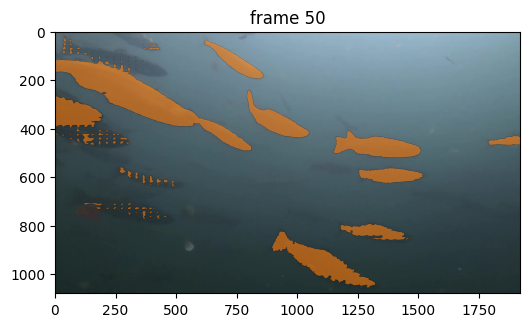

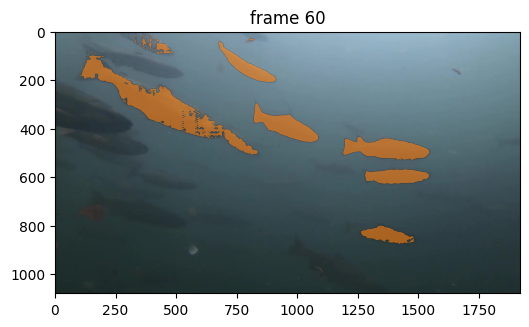

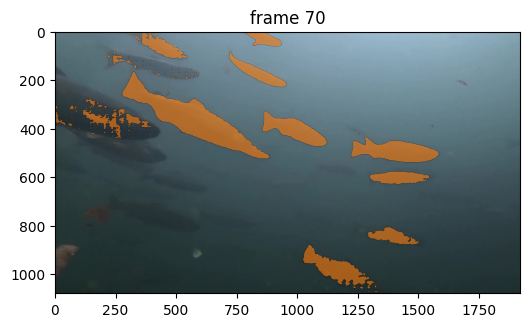

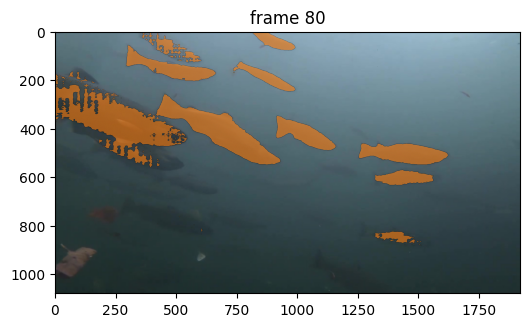

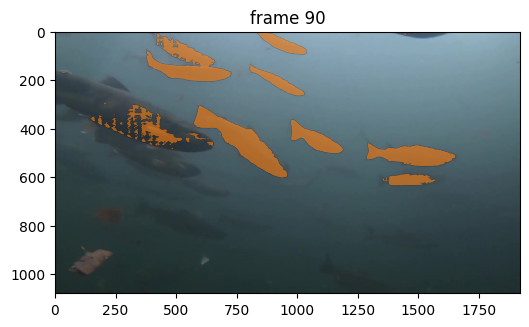

In [17]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The model doesn't seem to really grasp the task of semantic segmentation, this make sense since SAM2 segment everything by object but not by class. Maybe this can work if instead we only track the background and not the objects.

### Example 4: Semantic Segmentation by prompting the background

TODO

### Example 5: Refine YOLO segmentation and apply tracking by using SAM2 temporal inference.

This time we are treating each object as it's own separate instance, so instead of semantic segmentation we are trying instance segmentation and testing it's tracking capacity.

For this we first need to find a way to obtain points of prompt for each frame.
1. Do image segmentation on each frame using YOLO.
2. Save and Load the frame masks results.
3. Select random points inside each mask for each frame and save them as prompts for each frame.
4. Init the state for video inference with SAM2 video predictor.
5. Add points prompt to each frame.
6. Propagate the inference throught the whole video.
7. Check the resulting masklet for the video.

##### Contours and centroid of segmentation
1. results[0] -> list of results for the image prediction
2. results[0].masks.xy -> list of contours
3. results[0].masks.xy[id] -> contour of the mask "id", as a numpy.ndarray of shape (Number of points, 2)
4. I need to plot the list of contours

Obtain the segmentation results from the image, in this case the first frame.

#### Step 2: Add the centroids as prompts.

In [9]:
predictor.reset_state(inference_state)

In [14]:
ann_frame_idx = 0  # the frame index we interact with

results = yolo_segmentator.predict(frame_paths[ann_frame_idx])


image 1/1 /home/asdasd/yolo-sam-2/videos/SHORT_Coho_Salmon_Underwater_Raw_Footage_100/00000.jpg: 384x640 13 salmons, 17.4ms
Speed: 37.1ms preprocess, 17.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


In [15]:
ann_frame_idx = 0  # the frame index we interact with

contours = get_contours(results)
centroids = get_centroids(contours)

points = np.array(centroids[0], dtype=np.float32)
labels = np.array([1], np.int32)
object_ids = np.arange(1, len(points) + 1, dtype=np.int32)
prompts = {}

for point, idx in zip (points, object_ids):
    point = point.reshape(1, -1)  # Convert to a 1x2 2D array
    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=idx,
        points=point,
        labels=labels,
    )
    prompts[idx] = point, labels

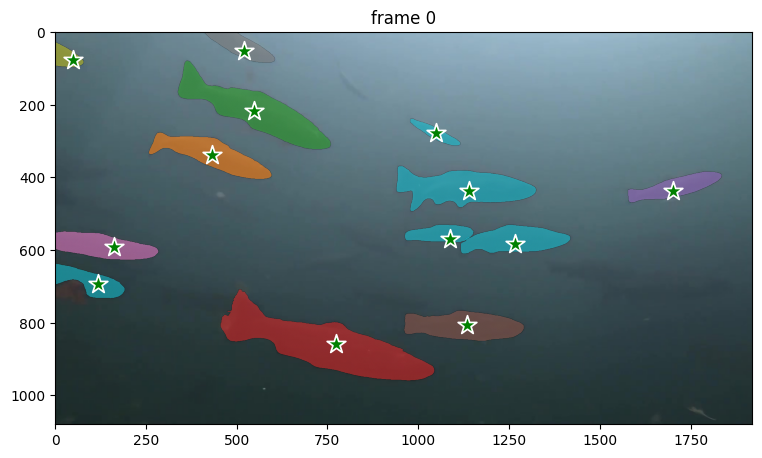

In [16]:
# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

#### Step 2: Propagate through video

Propagation becomes significately slower with multiple instances.

In [17]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 100/100 [00:51<00:00,  1.96it/s]


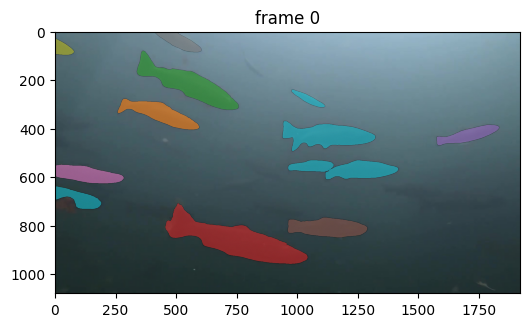

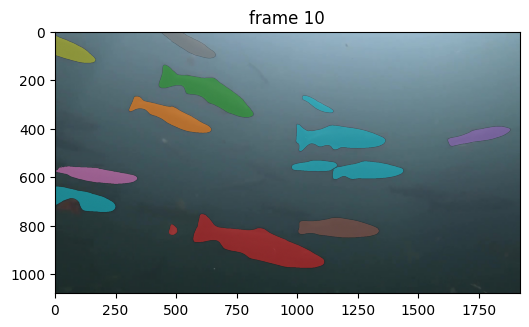

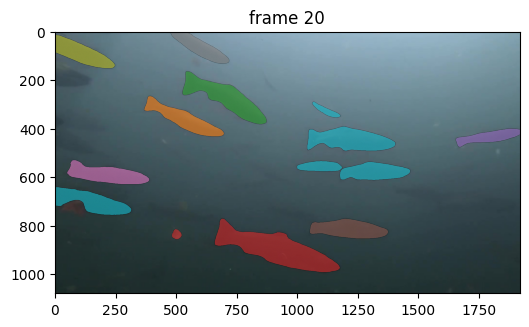

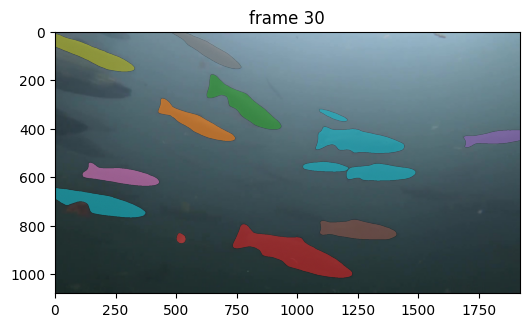

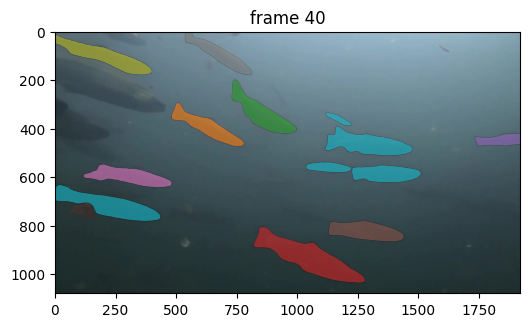

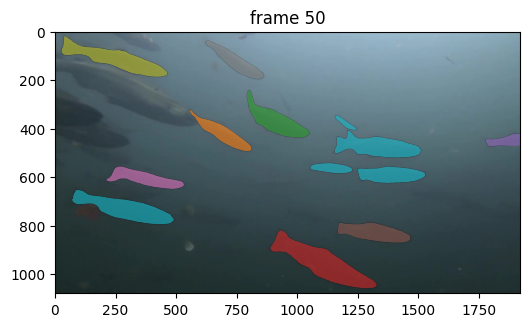

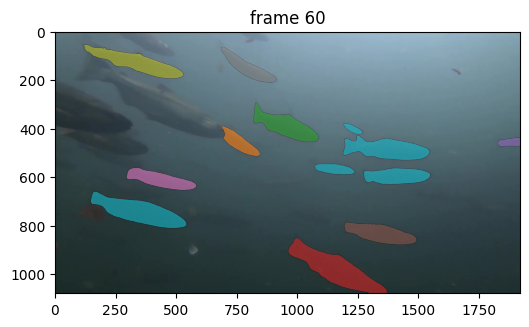

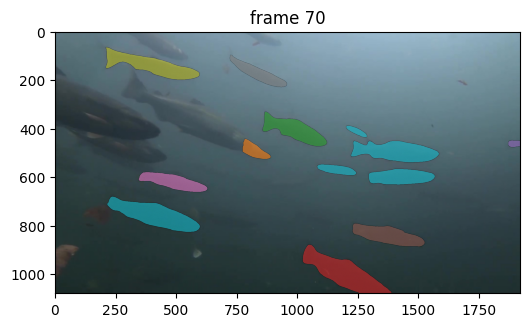

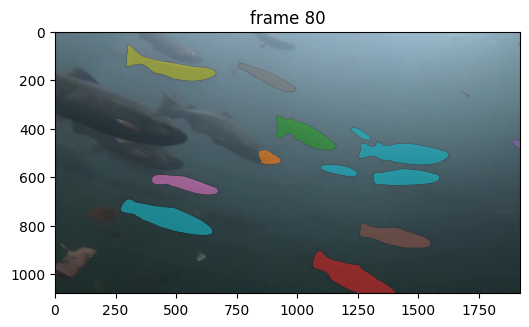

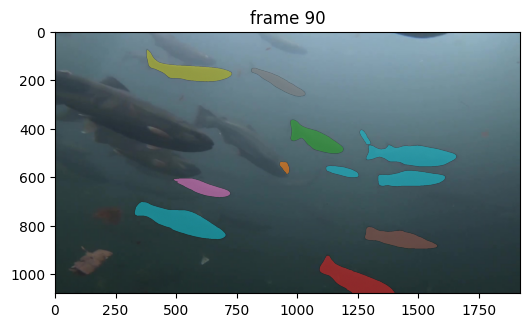

In [18]:
# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

### Conclusions
1. SAM2 is amazing for instance segmentation and tracking given correct prompts.
2. SAM2 still suffers from problems with occlusion and low quality images.
3. SAM2 doesn't work as well for semantic segmentation. Maybe this can be fined tuned, more research on the code is required.
4. Work is needed for testing instance segmentation with tracking since we didn't manage to workaround the code to do it.